In [1]:
import numpy as np
import pandas as pd

from datetime import datetime
from scipy.stats import skew  # for some statistics
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax, probplot
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from mlxtend.regressor import StackingCVRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import matplotlib.pyplot as plt
import scipy.stats as stats
import sklearn.linear_model as linear_model
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')

/anaconda2/envs/py36/lib/python3.6/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_9.4.1) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [2]:
#Reading the data
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

print('Train: {} sales and {} features'.format(train.shape[0], train.shape[1]))
print('Test: {} sales and {} features'.format(test.shape[0], test.shape[1]))

Train: 1460 sales and 81 features
Test: 1459 sales and 80 features


In [3]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


# 1. EDA and a bit of data processing

### 1.1 Overview

There are **1460** instances of training data and **1460** of test data. Total number of attributes equals 81, of which 36 is quantitative, 43 categorical + Id and SalePrice. From the table below we can notice:
* There are many features with missing values and some of them has incorrect data type
* `MSSubClass` is a categorical feature representing **16** building classes of houses. This feature is converted to **object** type, because leaving it as **int64** will result in linear relationship with target value, what is incorrect

In [5]:
features = pd.concat([train, test], sort = True).reset_index(drop=True)

#Convert cat feature with num values to cat values
features['MSSubClass'] = features['MSSubClass'].apply(str)
print(features.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
1stFlrSF         2919 non-null int64
2ndFlrSF         2919 non-null int64
3SsnPorch        2919 non-null int64
Alley            198 non-null object
BedroomAbvGr     2919 non-null int64
BldgType         2919 non-null object
BsmtCond         2837 non-null object
BsmtExposure     2837 non-null object
BsmtFinSF1       2918 non-null float64
BsmtFinSF2       2918 non-null float64
BsmtFinType1     2840 non-null object
BsmtFinType2     2839 non-null object
BsmtFullBath     2917 non-null float64
BsmtHalfBath     2917 non-null float64
BsmtQual         2838 non-null object
BsmtUnfSF        2918 non-null float64
CentralAir       2919 non-null object
Condition1       2919 non-null object
Condition2       2919 non-null object
Electrical       2918 non-null object
EnclosedPorch    2919 non-null int64
ExterCond        2919 non-null object
ExterQual        2919 non-null object
Exterior1st      291

In [6]:
'''#Will place quantitative and qualitative to separate lists of features
numerical = [f for f in train.columns if train.dtypes[f] != 'object']
numerical.remove('SalePrice')
numerical.remove('Id')

categorical = [f for f in train.columns if train.dtypes[f] == 'object'] '''

"#Will place quantitative and qualitative to separate lists of features\nnumerical = [f for f in train.columns if train.dtypes[f] != 'object']\nnumerical.remove('SalePrice')\nnumerical.remove('Id')\n\ncategorical = [f for f in train.columns if train.dtypes[f] == 'object'] "

### 1.2 Missing Values

* **19** attributes have missing values in train set, 5 over 50% of all data. **32** features have missing values in test set

* Most of times NA means absence of certain facility, like missing pool, fence, no garage and basement, this category means **systematically** missing data, another type is **randomly** missing data. These two types should be processed separately

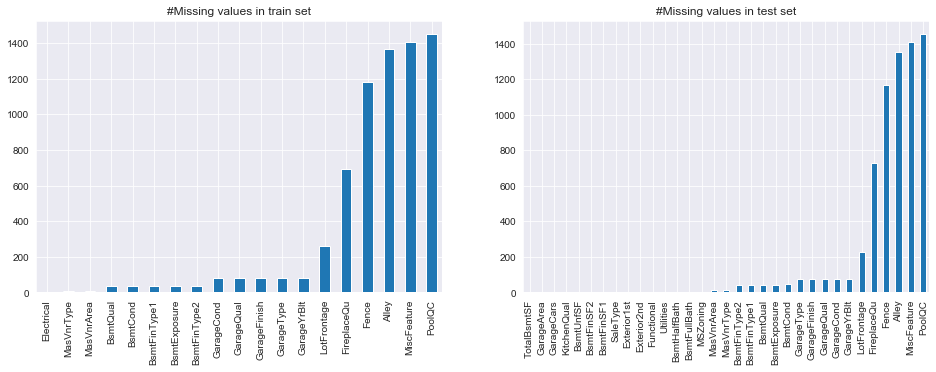

In [7]:
#Visualize # missing values
fig, axs = plt.subplots(ncols=2, figsize=(16, 5))
sns.set_style('darkgrid')

i=1
for df in (train, test):
    missing = df.isnull().sum()
    missing = missing[missing > 0]
    missing.sort_values(inplace=True)
    plt.subplot(1, 2, i)
    missing.plot.bar()
    if i == 1: plt.title("#Missing values in train set")
    else: plt.title("#Missing values in test set")
    i += 1

### 1.2.1 *Systematically missing data*

* `BsmtFinSF1`, `BsmtFinSF2`, `BsmtUnfSF`, and `TotalBsmtSF` are basement area in square feet. There is only 1 house in test with all these nissing values. All other basement features for that house are also missing, so it is likely, that this house doesn't have basement. That's why missing values in `BsmtFinSF1`, `BsmtFinSF2`, `BsmtUnfSF`, and `TotalBsmtSF` are filled with **0**. Categorical features `BsmtCond`, `BsmtExposure`, `BsmtFinType1`, `BsmtFinType2`, `BsmtQual` are filled with **None**, because they are missing in houses without basement. Missing values in ordinal basement features `BsmtFullBath` and `BsmtHalfBath` will be also replaced with **0**. 


* `GarageArea` is defined as garage area in square feet. There is only. 1 house with missing values in `GarageCars` and `GarageArea` with missing other categorical features. Missing values in `GarageCars` and `GarageArea` will be filled with **0**, because this house doesn't have garage. Ordinal `GarageYrBlt` will be filled with **0**, categorical `GarageType`, `GarageFinish`, `GarageQual` and `GarageCond` - with **None**


* Systematically missing values for categorical features `Alley`, `Fence`, `FireplaceQu`, `MiscFeature` and `PoolQC` will be filled with **None**, because those features doesn't exist in those houses

In [8]:
# Filling masonry veneer features
features['MasVnrArea'] = features['MasVnrArea'].fillna(0)
features['MasVnrType'] = features['MasVnrType'].fillna('None')

#Filling categorical, continious and ordinal basement features
for col in ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']:
    features[col] = features[col].fillna('None')
for col in ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']:
    features[col] = features[col].fillna(0)

#Filling categorical, continious and ordinal garage features
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    features[col] = features[col].fillna('None')
for col in ['GarageArea', 'GarageCars', 'GarageYrBlt']:
    features[col] = features[col].fillna(0)

#Filling other categorical features
for col in ['Alley', 'Fence', 'FireplaceQu', 'MiscFeature', 'PoolQC']:
    features[col] = features[col].fillna('None')

In [9]:
#Display #missing values
print(features.isna().sum()[features.isna().sum() > 0])

Electrical        1
Exterior1st       1
Exterior2nd       1
Functional        2
KitchenQual       1
LotFrontage     486
MSZoning          4
SalePrice      1459
SaleType          1
Utilities         2
dtype: int64


### 1.2.2 *Randomly missing data*

* There are few features left with randomly missing values. A house can't exist without that features, so they can't be filled as **0** or **None**. The number of randomly missing values is much more smaller, so they will be replaced with statistical values, based on the values of neighbor and same building class houses

**Categorical** features will be replaced with mode, **numerical** - with median

In [10]:
for col in ['Electrical', 'Exterior1st', 'Exterior2nd', 'Functional', 'KitchenQual', 
            'MSZoning', 'SaleType', 'Utilities']:
    features[col] = features.groupby(['Neighborhood', 'MSSubClass'])[col].apply(lambda x: x.fillna(x.mode()[0]))
    
features['LotFrontage'] = features.groupby('Neighborhood')['LotFrontage'].apply(lambda x: x.fillna(x.median()))
    
print(features.isna().sum()[features.isna().sum() > 0])

SalePrice    1459
dtype: int64


### 1.3 Target distribution

* Target value is not normally distributed. Training set `SalePrice` has high positive skew of **1.88**. The distribution is assymetrical, because of the extremely high outliers.


* Kurtosis of **6.53** indicates thhe tail extremity. Huge gap between mean and median is also the result of outliers.


* Probability plot clearly illustrates that outliers will strongly affect the regression models since a single outlier may result in all predictor coefficients being biased. The probability being a convex curve rather than a straight line is the result of the skewness.

* Before performing regression it has to be transformed. While log transformation does pretty good job, best fit is unbounded Johnson distribution.

Training Set SalePrice Skew: 1.8828757597682129
Training Set SalePrice Kurtosis: 6.536281860064529
Training Set SalePrice Mean: 180921.19589041095
Training Set SalePrice Median: 163000.0
Training Set SalePrice Max: 755000


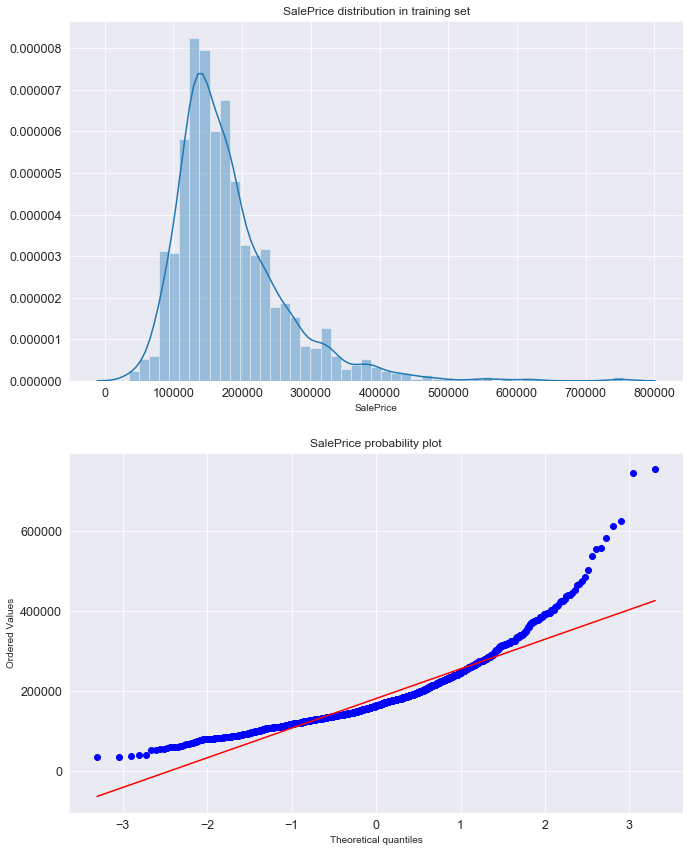

In [11]:
print('Training Set SalePrice Skew: {}'.format(train['SalePrice'].skew()))
print('Training Set SalePrice Kurtosis: {}'.format(train['SalePrice'].kurt()))
print('Training Set SalePrice Mean: {}'.format(train['SalePrice'].mean()))
print('Training Set SalePrice Median: {}'.format(train['SalePrice'].median()))
print('Training Set SalePrice Max: {}'.format(train['SalePrice'].max()))

fig, axs = plt.subplots(nrows=2, figsize=(11, 11))
plt.subplots_adjust(bottom=3, top=4)

sns.distplot(train['SalePrice'], ax=axs[0])
probplot(train['SalePrice'], plot=axs[1])

axs[0].set_title('SalePrice distribution in training set')
axs[1].set_title('SalePrice probability plot')

#make subscripts larger
for i in range(2):
    axs[i].tick_params(axis='x', labelsize=12.5)
    axs[i].tick_params(axis='y', labelsize=12.5)

plt.show()

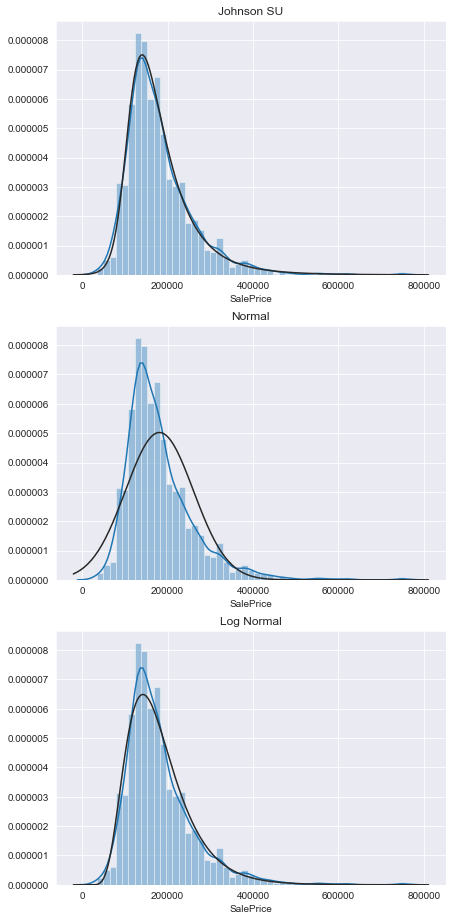

In [12]:
#Will take a look at which distribution fits SalePrice
fig, axs = plt.subplots(nrows=3, figsize=(7,12))
plt.subplots_adjust(bottom=3, top=4)

sns.distplot(train['SalePrice'], fit=stats.johnsonsu, ax=axs[0])
sns.distplot(train['SalePrice'], fit=stats.norm, ax=axs[1])
sns.distplot(train['SalePrice'], fit=stats.lognorm, ax=axs[2])

axs[0].set_title('Johnson SU')
axs[1].set_title('Normal')
axs[2].set_title('Log Normal')

plt.show()

### 1.4 Correlations

* There are many features highly correlated with target value, but it looks like multicollinearity occurs in the dataset.
* There highest such correlation between `GarageArea` and `GarageCars`, which is **0.85**
* Correlations of training and test set are very close

In [13]:
train, test = features.loc[:1459], features[1459:].drop(['SalePrice'], axis=1)

#Drop ordinal features and Id
cols = ['GarageYrBlt', 'Id', 'MSSubClass', 'MoSold', 'YearBuilt', 'YearRemodAdd', 'YrSold']

#Calculate spearman correlation
train_corr = train.drop(cols, axis=1).corr('spearman').abs().unstack().sort_values(ascending=False).reset_index()

#Rename cols
train_corr.rename(columns={'level_0': 'Feature_1', 'level_1': 'Feature_2', 0: 'Corr'}, inplace = True)

#Drop 1.0 correlations
train_corr.drop(train_corr[train_corr['Corr'] == 1.0].index, inplace=True)

train_corr[train_corr['Feature_1'] == 'SalePrice']

,Feature_1,Feature_2,Corr
38,SalePrice,OverallQual,0.809829
39,SalePrice,GrLivArea,0.731310
42,SalePrice,GarageCars,0.690711
50,SalePrice,GarageArea,0.649379
54,SalePrice,FullBath,0.635957
64,SalePrice,TotalBsmtSF,0.602725
70,SalePrice,1stFlrSF,0.575408
80,SalePrice,TotRmsAbvGrd,0.532586
82,SalePrice,Fireplaces,0.519247
98,SalePrice,OpenPorchSF,0.477561


In [14]:
train_corr.head(10)

,Feature_1,Feature_2,Corr
31,GarageCars,GarageArea,0.853317
32,GarageArea,GarageCars,0.853317
33,TotalBsmtSF,1stFlrSF,0.829292
34,1stFlrSF,TotalBsmtSF,0.829292
35,TotRmsAbvGrd,GrLivArea,0.827874
36,GrLivArea,TotRmsAbvGrd,0.827874
37,OverallQual,SalePrice,0.809829
38,SalePrice,OverallQual,0.809829
39,SalePrice,GrLivArea,0.731310
40,GrLivArea,SalePrice,0.731310


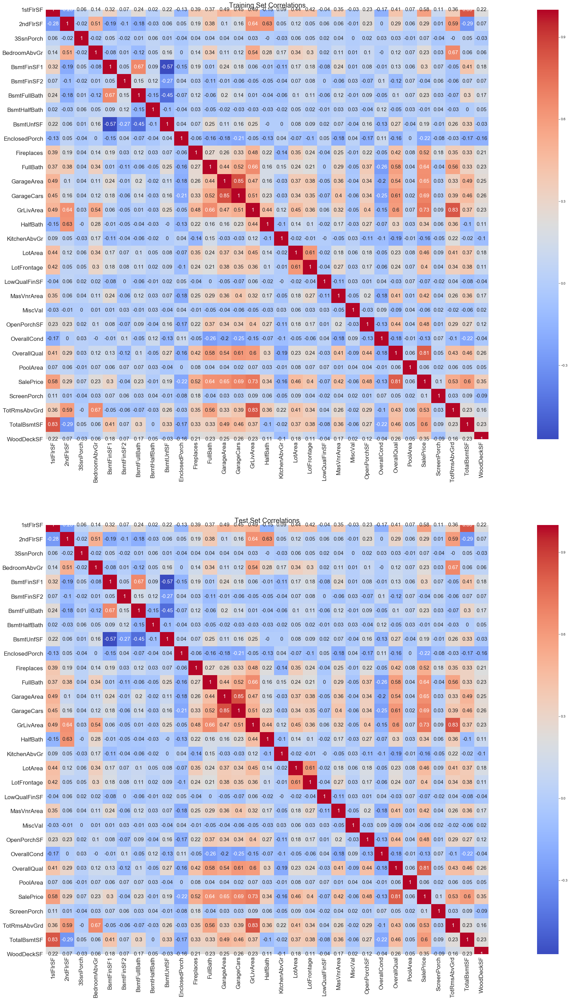

In [15]:
fig, axs = plt.subplots(nrows=2, figsize=(50, 50))

sns.heatmap(train.drop(cols, axis=1).corr('spearman').round(2), ax=axs[0], annot=True, square=True,
           cmap='coolwarm', annot_kws={'size': 15})
sns.heatmap(train.drop(cols, axis=1).corr('spearman').round(2), ax=axs[1], annot=True, square=True,
           cmap='coolwarm', annot_kws={'size': 15})

axs[0].tick_params(labelsize=17)
axs[i].tick_params(labelsize=17)

axs[0].set_title('Training Set Correlations', size=20)
axs[1].set_title('Test Set Correlations', size=20)

plt.show()

### 1.5 Target vs Features

### 1.5.1 *Numerical features*

* Features `1stFlrSF`, `BsmtUnfSF`, `GarageArea`, `GrLivArea`, `LotArea`, `LotFrontage`, `TotalBsmtSF` are not stacked to **0** as other numerical features. Fitting regression line is easier for those features. In theese features outliers are very visible.

* Data points of `2ndFlrSF`, `3SsnPorch`, `BsmtFinSF1`, `BsmtFinSF2`, `EnclosedPorch`, `LowQualFinSF`, `MasVnrArea`, `MiscVal`, `OpenPorchSF`, `PoolArea`, `ScreenPorch` and `WoodDeckSF` features are heavily stacked at **0**. They don't exist in every house, so they are sparse features. These features will introduce bias for the model

* `GarageYrBlt`, `YearBuilt` and `YearRemodAdd` are ordinal features, but a linear relationship can be seen from their plots. Houses with recent dates are more likely to be sold at higher prices.

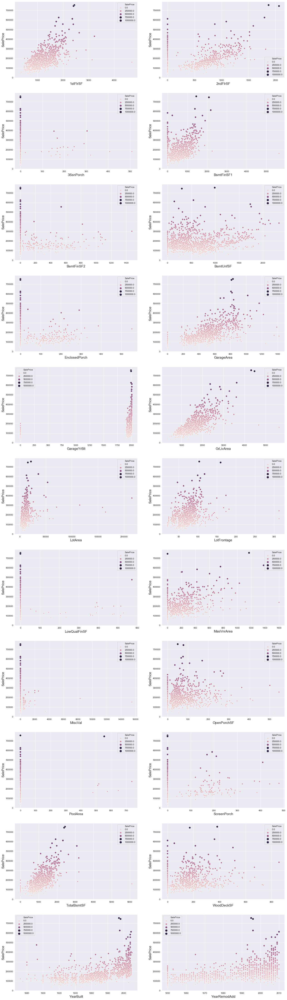

In [16]:
num_features = ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2', 
                'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GarageYrBlt', 'GrLivArea', 
                'LotArea', 'LotFrontage', 'LowQualFinSF', 'MasVnrArea', 'MiscVal', 
                'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF', 
                'YearBuilt', 'YearRemodAdd']

fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(12,80))
plt.subplots_adjust(right=1.5)

for i, feature in enumerate(num_features, 1):    
    plt.subplot(11, 2, i)
    sns.scatterplot(data=train, x=feature, y='SalePrice', hue='SalePrice', size='SalePrice')
    plt.xlabel('{}'.format(feature), size=15)
    plt.ylabel('SalePrice', size=15)
    
plt.show()

### 1.5.2 *Categorical features*

* Data points of `MoSold` and `YrSold` are uniformly distributed between classes. Those two features might have the least information about `SalePrice` among other categorical features.


* Values in some of some features have very distinct `SalePrice` maximums, minimums and interquartile ranges. Those features could be useful in tree based algorithms.  

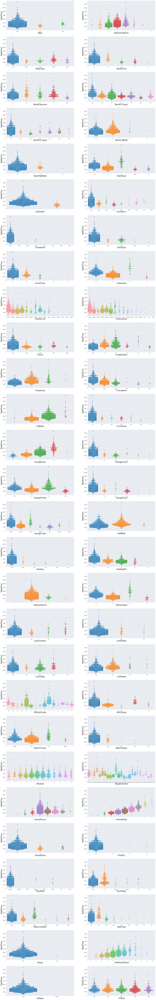

In [17]:
cat_features = ['Alley', 'BedroomAbvGr', 'BldgType', 'BsmtCond', 'BsmtExposure', 
                'BsmtFinType1', 'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath', 'BsmtQual', 
                'CentralAir', 'Condition1', 'Condition2', 'Electrical', 'ExterCond', 
                'ExterQual', 'Exterior1st', 'Exterior2nd', 'Fence', 'FireplaceQu', 
                'Fireplaces', 'Foundation', 'FullBath', 'Functional', 'GarageCars', 
                'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType', 'HalfBath', 
                'Heating', 'HeatingQC', 'KitchenAbvGr', 'KitchenQual', 'LandContour', 
                'LandSlope', 'LotConfig', 'LotShape', 'MSSubClass', 'MSZoning', 
                'MasVnrType', 'MiscFeature', 'MoSold', 'Neighborhood', 'OverallCond', 
                'OverallQual', 'PavedDrive', 'PoolQC', 'RoofMatl', 'RoofStyle', 
                'SaleCondition', 'SaleType', 'Street', 'TotRmsAbvGrd', 'Utilities', 'YrSold']

fig, axs = plt.subplots(ncols=2, nrows=28, figsize=(18, 120))
plt.subplots_adjust(right=1.5, top=1.5)

for i, feature in enumerate(cat_features, 1):    
    plt.subplot(28, 2, i)
    sns.swarmplot(data=train, x=feature, y='SalePrice')
        
    plt.xlabel('{}'.format(feature), size=25)
    plt.ylabel('SalePrice', size=25)
    
plt.show()

### 1.6 Feature distribution comparison

### 1.6.1 *Numerical features*

* `1stFloorSF`, `2ndFloorSF`, `BsmtFinSF1`, `BsmtUnfSF`, `GarageArea`, `GarageYrBlt`, `GrLivArea`, `LotArea`, `LotFrontage`, `MasVnrArea`, `OpenPorchSF`, `TotalBsmtSF`, `WoodDeckSF`, `YearBuilt` and `YearRemodAdd` features have similar distributions in training set and test set. Models using these features, are less likely to overfit.
* `3SsnPorch`, `BsmtFinSF2`, `EnclosedPorch`, `LowQualFinSF`, `MiscVal`, `PoolArea` and `ScreenPorch` are too noisy. The distributions of those features in training set and test set doesn't match, so they might introduce bias to the models.

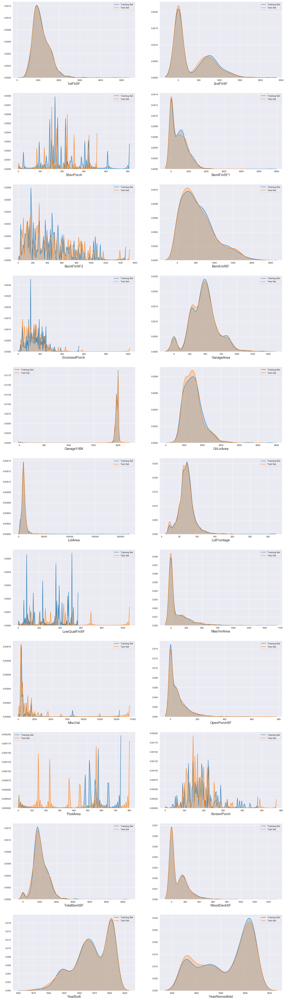

In [18]:
fig, axs = plt.subplots(ncols=2, nrows=11, figsize=(12, 80))
plt.subplots_adjust(right=1.5)

for i, feature in enumerate(num_features, 1):    
    plt.subplot(11, 2, i)
    sns.kdeplot(train[feature], label='Training Set', shade=True)
    sns.kdeplot(test[feature], label='Test Set', shade=True)
        
    plt.xlabel('{}'.format(feature), size=15)

plt.show()

### 1.6.2 *Categorical features*

* Values in some categorical features exist in one set, but doesn't exist in another set. This problem exists in `BedroomAbvGr`, `Condition2`, `Electrical`, `Exterior1st`, `Exterior2nd`, `Fireplaces`, `FullBath`, `GarageCars`, `GarageQual`, `Heating`, `KitchenAbvGr`, `MSSubClass`, `MiscFeature`, `PoolQC`, `RoofMatl` and `Utilities` features. This is a potential problem because some of the categorical features are going to be one-hot encoded, and because of that process, the feature counts of training set and test set might not match.
* Other categorical feature value counts in training set and test set are close to each other. Those features have similar distributions in both datasets, so they are more reliable than the previous ones.

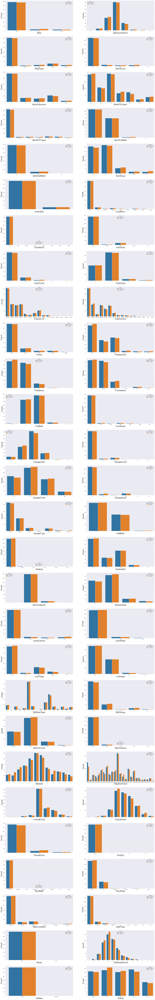

In [19]:
train['Dataset'] = 'Training Set'
test['Dataset'] = 'Test Set'
df_all = pd.concat([train, test], sort=True).reset_index(drop=True)

fig, axs = plt.subplots(ncols=2, nrows=28, figsize=(18, 120))
plt.subplots_adjust(right=1.5, top=1.5)

for i, feature in enumerate(cat_features, 1):    
    plt.subplot(28, 2, i)
    sns.countplot(x=feature, hue='Dataset', data=df_all)
        
    plt.xlabel('{}'.format(feature), size=25)
    plt.ylabel('Count', size=25)

plt.show()           

### 1.7. Conclusion

* There are features with ambiguous types. `GarageYrBlt`, `MoSold`, `YearBuilt`, `YearRemodAdd` and `YrSold` are date features. Those are numerical features by default, and they imply linear relationship. It might be better to use some of them as categorical features. 
* There were **24** features with systematically missing data. Those features are filled with **None** and **0** depending on their types which made them sparse. Converting those features from multi class or continuous to binary, could give better results.
* Target (`SalePrice`) distribution is highly skewed and long tailed because of the outliers. It requires a transformation in order to perform better in models. Dealing with the outliers could also achieve better model performance.
* Many features are strongly correlated with each other and target. This relationship can be used to create new features with feature interaction in order to overcome multicollinearity issue.
* **12** continuous features are heavily stacked at **0**. They are also sparse features. Those features may add bias to the model without binning.
* Some categorical features are not informative for two reasons. The feature is either too homogenous like `Utilities` feature, or all of the values have the same characteristics like `MoSold` feature. Those features can be conbined with other features or dropped completely.
* There are some numerical feature distributions that are too noisy. Their distributions in training and test set are quite different. They may require binning to overcome this problem. The same problem occurs for categorical features as well. There are some categorical feature values that doesn't exist in both training set and test set. They need to be grouped with other values.

0.8446238350467035


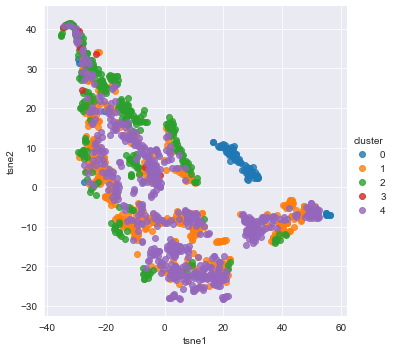

In [20]:
#Reduce dimensions to 2, so that to visualize objects
model = TSNE(n_components=2, random_state=0, perplexity=50)
X = train[num_features].values
tsne = model.fit_transform(X)

#Scale features, PCA to 30 components, kmeans on them
std = StandardScaler()
s = std.fit_transform(X)
pca = PCA(n_components=13)
pca.fit(s)
pc = pca.transform(s)
kmeans = KMeans(n_clusters=5)
kmeans.fit(pc)

reduced = pd.DataFrame({'tsne1': tsne[:,0], 'tsne2': tsne[:,1], 'cluster': kmeans.labels_})
sns.lmplot(data=reduced, x='tsne1', y='tsne2', hue='cluster', fit_reg=False)
print(np.sum(pca.explained_variance_ratio_))

# 2 Feature engineering

### 2.1 Creating new features

* `YrBuiltAndRemod`, `TotalSF`, `TotalFinSF`, `TotalBath`, `TotalPorchSF`, `OverallRating` new features were created to represent total number of related features

* `HasPool`, `Has2ndFlr`, `HasGarage`, `HasBsmt`, `HasFireplace` new features indicating if house have this particular feature

* `NewHouse` was created to seperate houses, which were built and sold at the same year

In [21]:
#Crating new features as year of construction + remod and 
#total of house's square, #baths, porches' square
features['YrBuiltAndRemod'] = features['YearBuilt'] + features['YearRemodAdd']

features['TotalSF'] = features['TotalBsmtSF'] + features['1stFlrSF'] + features['2ndFlrSF']

features['TotalFinSF'] = features['BsmtFinSF1'] + features['BsmtFinSF2'] + \
                        features['1stFlrSF'] + features['2ndFlrSF']

features['TotalBath'] = features['FullBath'] + (0.5 * features['HalfBath']) + \
                        features['BsmtFullBath'] + (0.5 * features['BsmtHalfBath'])

features['TotalPorchSF'] = features['OpenPorchSF'] + features['3SsnPorch'] + \
                         features['EnclosedPorch'] + features['ScreenPorch'] + features['WoodDeckSF']

features['OverallRating'] = features['OverallQual'] + features['OverallCond']

#Create new binary features indicating pool, 2nd Floor, garage, basement, fireplace
features['HasPool'] = features['PoolArea'].apply(lambda x: 1 if x > 0 else 0)

features['Has2ndFlr'] = features['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)

features['HasGarage'] = features['GarageArea'].apply(lambda x: 1 if x > 0 else 0)

features['HasBsmt'] = features['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)

features['HasFireplace'] = features['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

#Creating new binary feature indicating whether a house new or not
features['NewHouse'] = 0
idx = features[features['YrSold'] == features['YearBuilt']].index
features.loc[idx, 'NewHouse'] = 1

print(features.shape)

(2919, 93)


### 2.2 Outliers

* There are two houses larger than **4500** square feet and sold for less than **300000**. Those two houses are dropped because they are affecting the regression coefficient of `GrLivArea` drastically.
* There is a house with less than **5** `OverallQual`, but sold for more than **200000**. That is an overly paid price for a low quality house, so it is dropped as well.

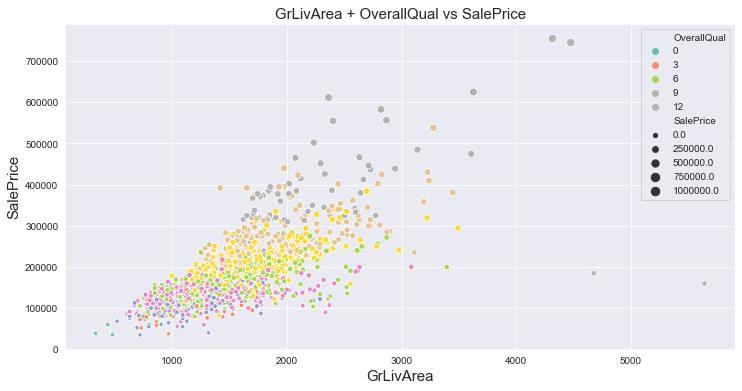

(2916, 93)


In [22]:
fig = plt.figure(figsize=(12, 6))

sns.scatterplot(data=features, x='GrLivArea', y='SalePrice', hue='OverallQual', size='SalePrice', palette='Set2')
plt.xlabel('GrLivArea', size=15)
plt.ylabel('SalePrice', size=15)

plt.title('GrLivArea + OverallQual vs SalePrice', size=15)
plt.show()

#Drop outlier objects
features.drop(features[np.logical_and(features['OverallQual'] < 5, features['SalePrice'] > 200000)].index, inplace=True)
features.drop(features[np.logical_and(features['GrLivArea'] > 4500, features['SalePrice'] < 300000)].index, inplace=True)
features.reset_index(drop=True, inplace=True)
print(features.shape)

### 2.3 Categorical features encoding

### 2.3.1 *Ordinal features*

* There are **45** categorical features and **23** are ordinal.

* **3** ordinal features `Utilities`, `Street`, `PoolQC` were dropped. `Street` and `PoolQC` have different values only for **10** houses and `Utilities` has different value on;y for **1** house.

* There are also partial ordinal features that are not label encoded because all of their values are not ordered.

In [23]:
bsmtcond_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4}
bsmtexposure_map = {'None': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4}
bsmtfintype_map = {'None': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6}
bsmtqual_map = {'None': 0, 'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
centralair_map = {'Y': 1, 'N': 0}
extercond_map = {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
exterqual_map = {'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
fireplacequ_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
functional_map = {'Typ': 0, 'Min1': 1, 'Min2': 1, 'Mod': 2, 'Maj1': 3, 'Maj2': 3, 'Sev': 4}
garagecond_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
garagefinish_map = {'None': 0, 'Unf': 1, 'RFn': 2, 'Fin': 3}
garagequal_map = {'None': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
heatingqc_map = {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
kitchenqual_map = {'Fa': 1, 'TA': 2, 'Gd': 3, 'Ex': 4}
landslope_map = {'Gtl': 1, 'Mod': 2, 'Sev': 3}
lotshape_map = {'Reg': 0, 'IR1': 1, 'IR2': 2, 'IR3': 3}
paveddrive_map = {'N': 0, 'P': 1, 'Y': 2}

features['BsmtCond'] = features['BsmtCond'].map(bsmtcond_map)
features['BsmtExposure'] = features['BsmtExposure'].map(bsmtexposure_map)
features['BsmtFinType1'] = features['BsmtFinType1'].map(bsmtfintype_map)
features['BsmtFinType2'] = features['BsmtFinType2'].map(bsmtfintype_map)
features['BsmtQual'] = features['BsmtQual'].map(bsmtqual_map)
features['CentralAir'] = features['CentralAir'].map(centralair_map)
features['ExterCond'] = features['ExterCond'].map(extercond_map)
features['ExterQual'] = features['ExterQual'].map(exterqual_map)
features['FireplaceQu'] = features['FireplaceQu'].map(fireplacequ_map)
features['Functional'] = features['Functional'].map(functional_map)
features['GarageCond'] = features['GarageCond'].map(garagecond_map)
features['GarageFinish'] = features['GarageFinish'].map(garagefinish_map)
features['GarageQual'] = features['GarageQual'].map(garagequal_map)
features['HeatingQC'] = features['HeatingQC'].map(heatingqc_map)
features['KitchenQual'] = features['KitchenQual'].map(kitchenqual_map)
features['LandSlope'] = features['LandSlope'].map(landslope_map)
features['LotShape'] = features['LotShape'].map(lotshape_map)
features['PavedDrive'] = features['PavedDrive'].map(paveddrive_map)

features.drop(columns=['Street', 'Utilities', 'PoolQC'], inplace=True)

### 2.3.2 *Nominal features*

* Nominal features were one-hot encoded, because there is no order in their values

In [24]:
nominal_features = ['Alley', 'BldgType', 'Condition1', 'Condition2', 'Electrical', 
                    'Exterior1st', 'Exterior2nd', 'Fence', 'Foundation', 'GarageType', 
                    'Heating', 'HouseStyle', 'LandContour', 'LotConfig', 'MSSubClass',
                    'MSZoning', 'MasVnrType', 'MiscFeature', 'MoSold', 'Neighborhood',
                    'RoofMatl', 'RoofStyle', 'SaleCondition', 'SaleType', 'YrSold']

encoded_features = []

for feature in nominal_features:
    encoded_df = pd.get_dummies(features[feature])
    encoded_df.columns = ['{}_{}'.format(feature, col) for col in encoded_df.columns]
    encoded_features.append(encoded_df)

features = pd.concat([features, *encoded_features], axis=1)
features.drop(columns=nominal_features, inplace=True)
print(features.shape)

(2916, 267)


### 2.4 Dealing with skewness

* The skewed and long tailed distribution of the `SalePrice` is solved by applying **log(1 + x)** transformation. This transformation reduced skewness from **1.88** to **0.12** and reduced kurtosis from **6.53** to **0.80**.
* Target is normally distributed after this transformation. Probability is a straight line rather than a convex curve.

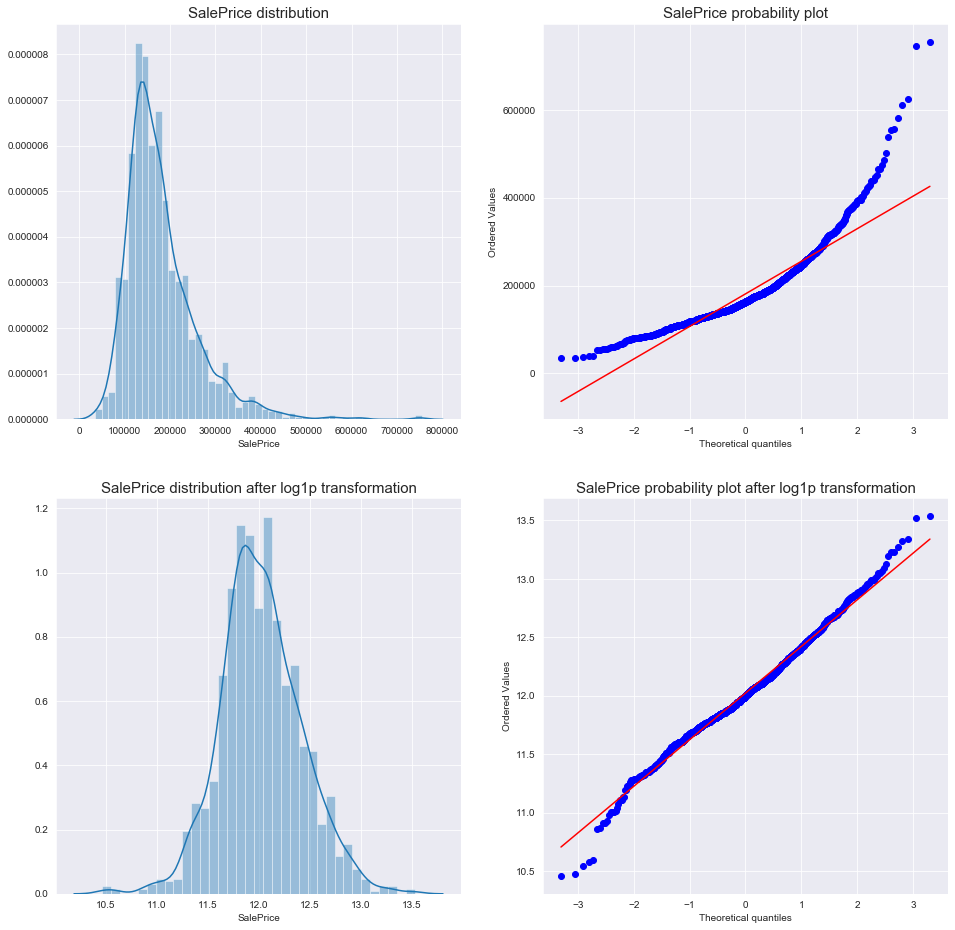

Training Set SalePrice Skew: 0.12304515868289596
Training Set SalePrice Kurtosis: 0.8076181684911377
(2916, 267)


In [25]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))

sns.distplot(train['SalePrice'], ax=axs[0][0])
probplot(train['SalePrice'], plot=axs[0][1])

features['SalePrice'] = np.log1p(features['SalePrice'])

sns.distplot(features['SalePrice'].dropna(), ax=axs[1][0])
probplot(features['SalePrice'].dropna(), plot=axs[1][1])

axs[0][0].set_title('SalePrice distribution', size=15)
axs[0][1].set_title('SalePrice probability plot', size=15)
axs[1][0].set_title('SalePrice distribution after log1p transformation', size=15)
axs[1][1].set_title('SalePrice probability plot after log1p transformation', size=15)

plt.show()

print('Training Set SalePrice Skew: {}'.format(features['SalePrice'].skew()))
print('Training Set SalePrice Kurtosis: {}'.format(features['SalePrice'].kurt()))
print(features.shape)

* The other highly skewed features are also transformed, but **boxcox1p** transformation is used for those features. **boxcox1p** is defined as $((1 + x)^{\lambda} - 1)$ if $\lambda$ is not **0**, and $log(1 + x)$ if $\lambda$ is **0**.
* **0.5** is used as a skewness threshold, and transformation is applied to features which have higher skew than the threshold. However, this doesn't work on every feature because some of them are sparse.

In [26]:
cont_features = ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2',
                 'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GrLivArea', 'LotArea', 
                 'LotFrontage', 'LowQualFinSF', 'MasVnrArea', 'MiscVal', 'OpenPorchSF', 
                 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF']

#Find skewed features
skew_features = features[cont_features].apply(lambda x: skew(x)).sort_values(ascending=False)
skew_index = skew_features[skew_features > 0.5].index

#Reduce skewness with boxcox
for i in skew_index:
    features[i] = boxcox1p(features[i], boxcox_normmax(features[i] + 1))
    
print(features.shape)

(2916, 267)


### 3.5 Preparing dataset for model

* Sparse features are dropped because they are tend to be ignored by tree algorithms. **99.94** is the threshold for the sparse features. If **99.94%** of the values of a feature are zeros, the feature is dropped.
* `Id` feature was also dropped.
* Finally, `X_train`, `y` and `X_test` are separated and ready for the machine learning models.

In [27]:
overfit = []
for i in features.columns:
    of = features[i].value_counts().iloc[0]
    if of / len(features) * 100 > 99.94:
        overfit.append(i)

features = features.drop(overfit, axis=1)
        
X_train, X_test = features.loc[:1456], features[1457:].drop(['SalePrice'], axis=1)


y = X_train['SalePrice']


X_train.drop(['Id', 'SalePrice'], axis=1, inplace=True)
X_test.drop(['Id'], axis=1, inplace=True)

print('X_train shape: {}'.format(X_train.shape))
print('y_train shape: {}'.format(y.shape))
print('X_test shape: {}'.format(X_test.shape))

X_train shape: (1457, 254)
y_train shape: (1457,)
X_test shape: (1459, 254)


# MODEL

In [28]:
#Setting metric and cross validation settings
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)

def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X_train):
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=kfolds))
    return rmse

alphas_alt = [14.5, 14.6, 14.7, 14.8, 14.9, 15, 15.1, 15.2, 15.3, 15.4, 15.5]
alphas2 = [5e-05, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008]
e_alphas = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007]
e_l1ratio = [0.8, 0.85, 0.9, 0.95, 0.99, 1]

In [29]:
#Linear models
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=alphas_alt, cv=kfolds))
lasso = make_pipeline(RobustScaler(), LassoCV(alphas=alphas2, max_iter=1e7, random_state=42, cv=kfolds))
elasticnet = make_pipeline(RobustScaler(), ElasticNetCV(max_iter=1e7, l1_ratio=e_l1ratio, alphas=e_alphas, cv=kfolds))
svr = make_pipeline(RobustScaler(), SVR(C= 20, epsilon= 0.008, gamma=0.0003))

In [30]:
#Gradient boostings
gbr = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =42)  

lightgbm = LGBMRegressor(objective='regression', 
                                       num_leaves=4,
                                       learning_rate=0.01, 
                                       n_estimators=5000,
                                       max_bin=200, 
                                       bagging_fraction=0.75,
                                       bagging_freq=5, 
                                       bagging_seed=7,
                                       feature_fraction=0.2,
                                       feature_fraction_seed=7,
                                       verbose=-1,
                                       )

xgboost = XGBRegressor(learning_rate=0.01,n_estimators=3460,
                                     max_depth=3, min_child_weight=0,
                                     gamma=0, subsample=0.7,
                                     colsample_bytree=0.7,
                                     objective='reg:linear', nthread=-1,
                                     scale_pos_weight=1, seed=27,
                                     reg_alpha=0.00006)

In [31]:
#Stacked Model
stack_model = StackingCVRegressor(regressors=(ridge, lasso, elasticnet, svr, gbr, lightgbm), 
                                 meta_regressor=xgboost, use_features_in_secondary=True)

In [32]:
#Cross Validation
for i in [[ridge, 'Ridge'], [lasso, 'Lasso'], [elasticnet, 'ElasticNet'],
          [svr, 'SVR'], [gbr, 'GBRegressor'], [lightgbm, 'LightGBM'], [xgboost, 'XGBoost']]:
    score = cv_rmse(i[0])
    print(i[1] + ': {:.4f} ({:.4f})\n'.format(score.mean(), score.std()))
    

Ridge: 0.1088 (0.0133)

Lasso: 0.1080 (0.0129)

ElasticNet: 0.1081 (0.0129)

SVR: 0.1101 (0.0130)

GBRegressor: 0.1140 (0.0120)

LightGBM: 0.1146 (0.0128)

[16:58:52] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:59:14] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:59:35] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:59:56] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:00:18] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in f

In [33]:
#Fitting the models
print('Stack Model')
stacked = stack_model.fit(np.array(X_train), np.array(y))

print('Lasso')
lassot = lasso.fit(X_train, y)

print('Ridge')
ridget = ridge.fit(X_train, y)

print('ElasticNet')
elasticnett = elasticnet.fit(X_train, y)

print('SVR')
svrt = svr.fit(X_train, y)

print('GradientBoosting')
gbrt = gbr.fit(X_train, y)

print('Light GradientBoosting')
lightgbmt = lightgbm.fit(X_train, y)

print('xgboost')
xgboostt = xgboost.fit(X_train, y)

Stack Model
[17:03:58] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Lasso
Ridge
ElasticNet
SVR
GradientBoosting
Light GradientBoosting
xgboost
[17:04:53] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


# Blending

In [34]:
def blending_predict(X):
    return ((0.1 * ridget.predict(X)) + \
            (0.05 * lassot.predict(X)) + \
            (0.1 * elasticnett.predict(X)) + \
            (0.1 * svrt.predict(X)) + \
            (0.1 * gbrt.predict(X)) + \
            (0.1 * lightgbmt.predict(X)) + \
            (0.15 * xgboostt.predict(X)) + \
            (0.3 * stacked.predict(X)))

In [35]:
print('RMSLE score on train data:')
print(rmse(y, blending_predict(X_train)))

RMSLE score on train data:
0.06073734386064763


In [40]:
preds = blending_predict(X_test)

In [41]:
submit = pd.read_csv('sample_submission.csv')
submit.iloc[:,1] = np.expm1(preds)

In [42]:
submit.head()

,Id,SalePrice
0,1461,121467.103804
1,1462,164677.438817
2,1463,187792.401784
3,1464,196051.678361
4,1465,190265.220998


In [44]:
submit.to_csv("submission.csv", index=False)